In [1]:
import osmnx as ox
import networkx as nx
import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt

In [2]:
G = ox.graph_from_place('London, UK', network_type='walk')

In [3]:
N, E = ox.graph_to_gdfs(G)

N = N.to_crs(27700)
E = E.to_crs(27700)

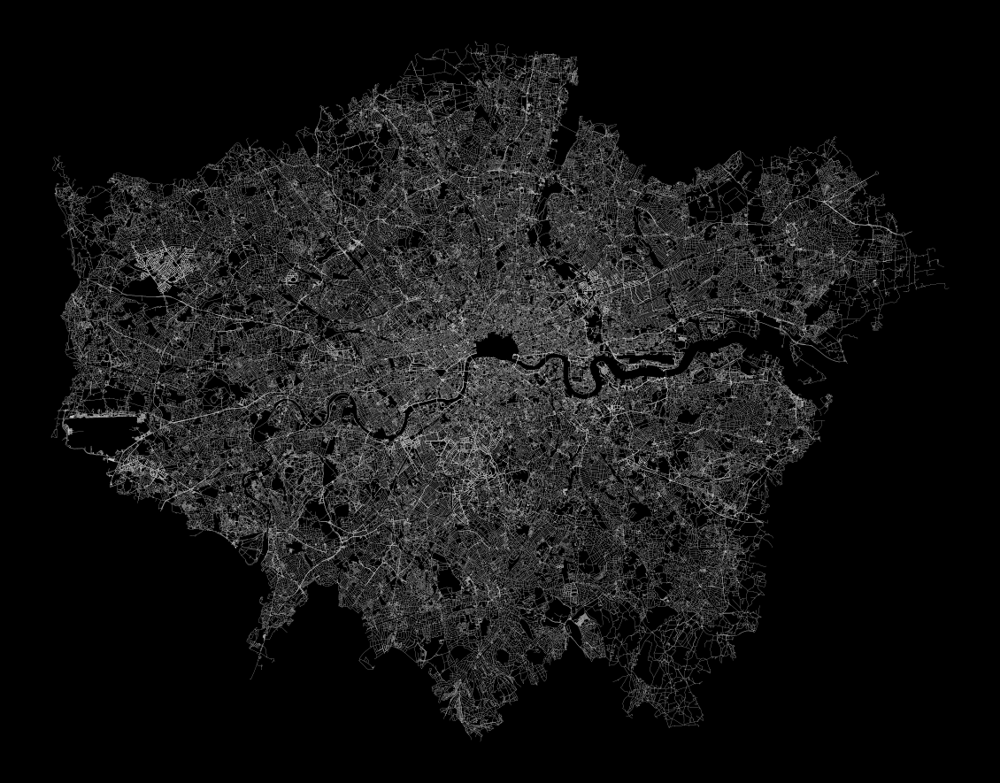

In [4]:
fig, ax = plt.subplots(1, 1, figsize = (20, 20), facecolor = 'k')

E.plot(color='w', ax=ax, linewidth=0.1)
ax.set_axis_off()
ax.set_facecolor('k')

In [5]:
parks = ox.geometries_from_place('London, UK', tags={'leisure':'park'})

/Users/andrewrenninger/opt/anaconda3/envs/sandbox/lib/python3.9/site-packages/osmnx/geometries.py:805: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for merged_outer_linestring in list(merged_outer_linestrings):
/Users/andrewrenninger/opt/anaconda3/envs/sandbox/lib/python3.9/site-packages/osmnx/geometries.py:805: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for merged_outer_linestring in list(merged_outer_linestrings):
/Users/andrewrenninger/opt/anaconda3/envs/sandbox/lib/python3.9/site-packages/osmnx/geometries.py:872: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` propert

In [6]:
parks = parks[parks.geometry.type!="Point"]
parks = parks.dissolve()
parks = parks.explode()

/var/folders/br/d_fg9g853bq1_bt73prjp3pr0000gn/T/ipykernel_50869/1327990030.py:3: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  parks = parks.explode()


In [7]:
parks = parks.to_crs(27700)

In [8]:
parks = parks[parks.geometry.area>250**2]

In [9]:
from shapely.geometry import Polygon

exteriors = list()

for i in parks.geometry.exterior:
    exterior = Polygon(i)
    exteriors.append(exterior)

In [10]:
parks['geometry'] = exteriors

In [11]:
parks.explore()

In [12]:
from shapely.ops import nearest_points

def find_entrance(row, nodes_data, point_column='geometry', value_column='geometry'):
    
    row = row['geometry']
    
    nng = nearest_points(row, nodes_data.geometry.unary_union)
    nni = nodes_data.loc[N['geometry'] == nng[1]]
    nnv = nni.index[0]
    
    gdf = gpd.GeoSeries(nng[1], crs=27700).to_crs(4326)
    
    return pd.Series({'index': nnv, 'y': gdf.geometry.y[0], 'x': gdf.geometry.x[0]})

In [13]:
print(parks.shape[0])

421


In [14]:
import math
nodes = list()

for i in np.arange(0, parks.shape[0]):
    print(i)
    
    park_boundary = parks.geometry.iloc[i]
    
    possible_entrances = E.unary_union.intersection(park_boundary.convex_hull.boundary).buffer(math.sqrt(park_boundary.length))
    possible_entrances = gpd.GeoDataFrame(geometry=gpd.GeoSeries(possible_entrances)).explode(index_parts=True)
    
    possible_entrances['geometry'] = possible_entrances.centroid
    possible_entrances.reset_index(drop=True, inplace=True)
    
    try: 
        temporary_nodes = possible_entrances.apply(find_entrance, nodes_data=N, axis=1)
        temporary_nodes['park'] = i
        
        nodes.append(temporary_nodes)
    
    except: 
        pass

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [15]:
nodes = pd.concat(nodes, ignore_index=True)

In [16]:
entrances = nodes.reset_index(drop=True)
entrances.head()

,index,y,x,park
0,2.962355e+08,51.428477,-0.379283,0
1,8.006566e+09,51.430236,-0.380235,0
2,2.962355e+08,51.432290,-0.382330,0
3,2.552567e+08,51.428064,-0.382620,0
4,2.962353e+08,51.428553,-0.385183,0


In [18]:
intersecting_nodes = N[~N.intersects(parks.geometry.unary_union.buffer(-10))].index
G_sub = G.subgraph(intersecting_nodes)

In [19]:
N_sub, E_sub = ox.graph_to_gdfs(G_sub)

In [20]:
E_sub = E_sub.reset_index()
E_sub = E_sub.drop('geometry', axis=1)

E_sub.head()

,u,v,key,osmid,name,highway,maxspeed,access,oneway,length,lanes,ref,bridge,junction,service,tunnel,width,est_width,area,landuse
0,78112,25508583,0,129375498,Outer Circle,unclassified,20 mph,permissive,False,19.391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,78112,25508584,0,129375498,Outer Circle,unclassified,20 mph,permissive,False,63.845,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,78112,25508584,1,4257258,Cambridge Terrace,residential,20 mph,permissive,False,102.544,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,99936,2146383892,0,204647016,York Terrace West,service,20 mph,permissive,False,15.832,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,99936,2146383887,0,204647020,York Gate,unclassified,20 mph,permissive,False,8.052,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
N_sub = N_sub.reset_index()
N_sub = N_sub.drop('geometry', axis=1)

N_sub.head()

,osmid,y,x,street_count,highway,ref
0,78112,51.526976,-0.145792,3,NaN,NaN
1,99936,51.523611,-0.152791,4,NaN,NaN
2,99937,51.523018,-0.152024,3,NaN,NaN
3,101818,51.535179,-0.148104,4,NaN,NaN
4,101831,51.535612,-0.147044,3,NaN,NaN


In [22]:
entrances = entrances.rename(columns={'index': 'osmid'})
entrances['osmid'] = entrances.osmid.astype('int64')

entrances.head()

,osmid,y,x,park
0,296235513,51.428477,-0.379283,0
1,8006565697,51.430236,-0.380235,0
2,296235469,51.432290,-0.382330,0
3,255256719,51.428064,-0.382620,0
4,296235342,51.428553,-0.385183,0


In [23]:
# N_sub.to_csv("london_nodes.csv")
# E_sub.to_csv("london_edges.csv")
# entrances.to_csv("london_entrances.csv")

In [24]:
node_set = set(entrances[entrances.osmid.isin(N_sub.osmid)].osmid.unique())

In [41]:
%time lines = nx.multi_source_dijkstra_path(G_sub, node_set, weight='length')
%time cells = nx.voronoi_cells(G_sub, node_set, weight='length')

CPU times: user 9.51 s, sys: 2.62 s, total: 12.1 s
Wall time: 15.5 s
CPU times: user 10.6 s, sys: 4.33 s, total: 15 s
Wall time: 24.9 s


In [42]:
cells = [pd.DataFrame({'parent': x[0], 'child': list(x[1])}) for x in cells.items()]
cells = pd.concat(cells).merge(entrances, left_on='parent', right_on='osmid', how='left').drop(['x', 'y'], axis=1)

In [43]:
cells = cells.merge(N_sub, left_on='child', right_on='osmid', how='left')

In [44]:
from colorcet import palette
from matplotlib import colors
pal = palette['glasbey_category10']
col = colors.ListedColormap(pal)

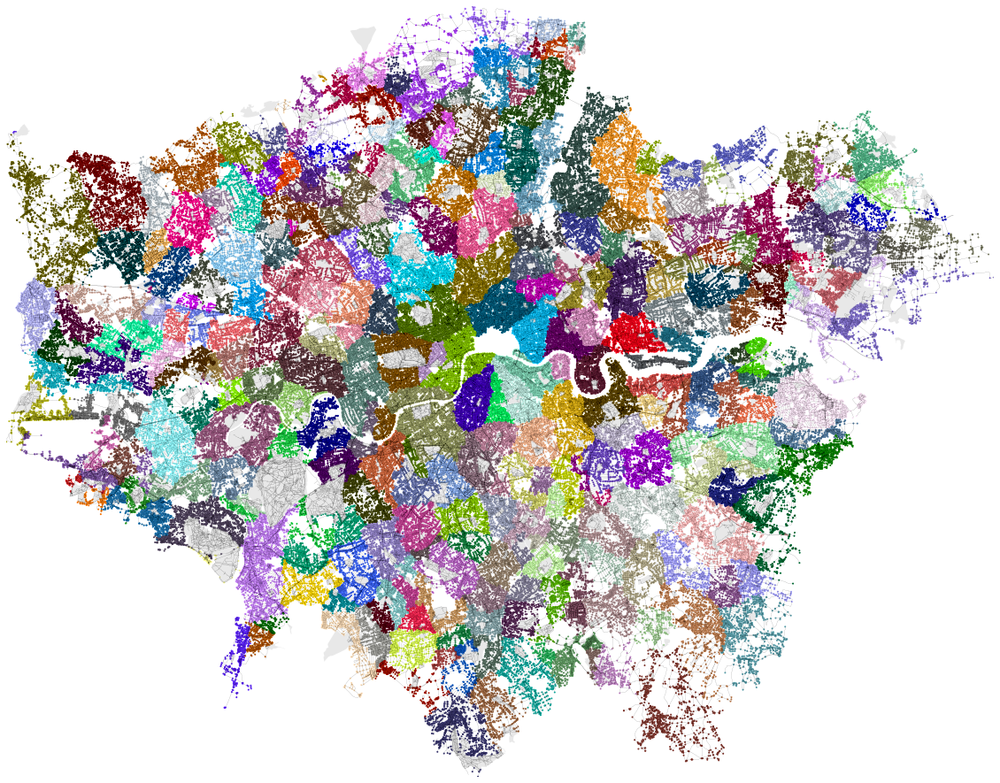

In [45]:
ax = E.plot(color='black', linewidth=0.05, figsize=(20, 20))
gpd.GeoDataFrame(cells, 
                 geometry=gpd.points_from_xy(cells.x, cells.y), 
                 crs=4326).to_crs(27700).plot('park', markersize=1, cmap=col, ax=ax)

parks.plot(color='lightgrey', alpha=0.5, ax=ax)

ax.set_xlim((N.geometry.x.min(), N.geometry.x.max()))
ax.set_ylim((N.geometry.y.min(), N.geometry.y.max()))
ax.set_axis_off()

In [46]:
%time lengths = nx.multi_source_dijkstra_path_length(G_sub, node_set, weight="length")

CPU times: user 8.06 s, sys: 1.6 s, total: 9.66 s
Wall time: 10.1 s


In [47]:
lengths = pd.DataFrame({'osmid':lengths.keys(), 'distance': lengths.values()})

In [48]:
col = colors.LinearSegmentedColormap.from_list("bmw", palette['bmw'][::-1])

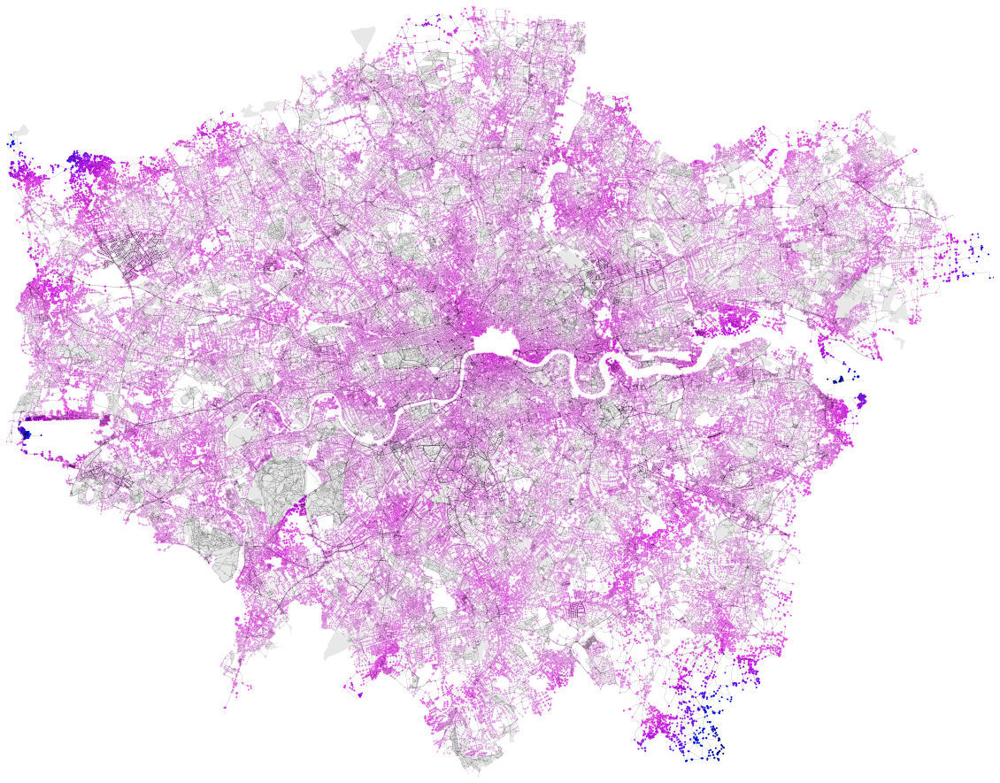

In [49]:
ax = E.plot(color='black', linewidth=0.05, figsize=(20, 20))
gpd.GeoDataFrame(cells, 
                 geometry=gpd.points_from_xy(cells.x, cells.y), 
                 crs=4326).merge(lengths, 
                                 left_on='child', 
                                 right_on='osmid',
                                 how='left').to_crs(27700).plot('distance', markersize=1, cmap=col, ax=ax)

parks.plot(color='lightgrey', alpha=0.5, ax=ax)

ax.set_xlim((N.geometry.x.min(), N.geometry.x.max()))
ax.set_ylim((N.geometry.y.min(), N.geometry.y.max()))
ax.set_axis_off()

In [50]:
threshold = 1.5 * 60 * 15

In [51]:
%time timed = nx.multi_source_dijkstra_path_length(G_sub, node_set, cutoff=threshold, weight="length")

CPU times: user 6.18 s, sys: 1.4 s, total: 7.58 s
Wall time: 8.01 s


In [52]:
times = pd.DataFrame({'osmid':timed.keys(), 'distance': timed.values()})

In [53]:
col = colors.LinearSegmentedColormap.from_list("bmw", palette['kbc'][::-1])

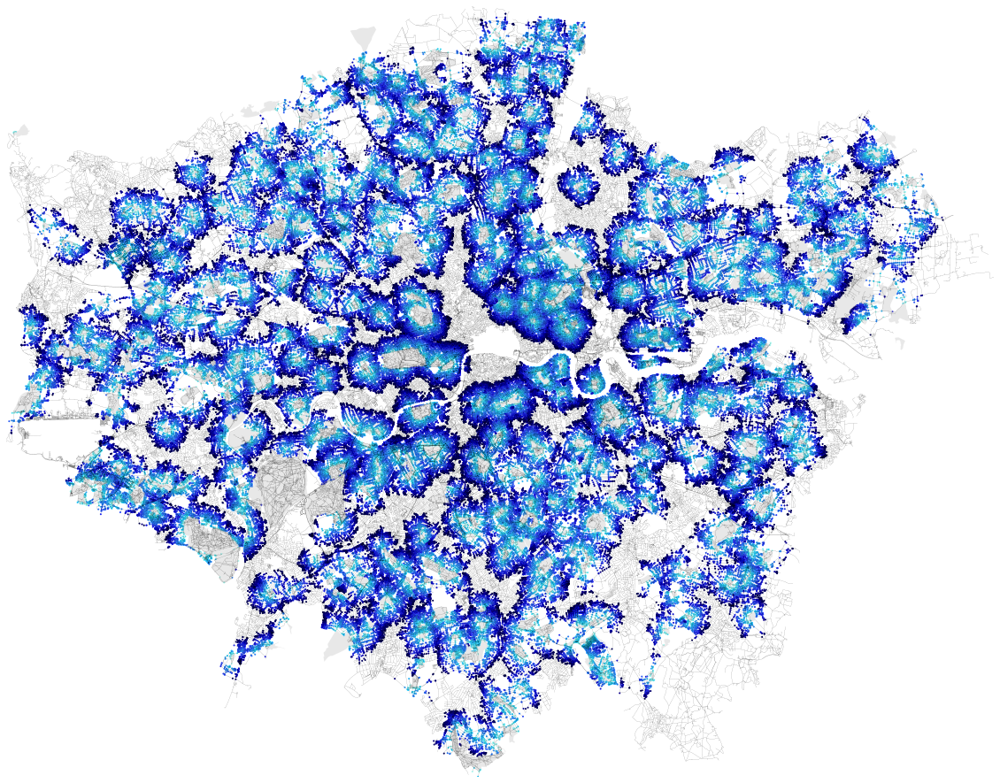

In [54]:
ax = E.plot(color='black', linewidth=0.05, figsize=(20, 20))
gpd.GeoDataFrame(cells, 
                 geometry=gpd.points_from_xy(cells.x, cells.y), 
                 crs=4326).merge(times, 
                                 left_on='child', 
                                 right_on='osmid',
                                 how='left').to_crs(27700).plot('distance', markersize=1, cmap=col, ax=ax)

parks.plot(color='lightgrey', alpha=0.5, ax=ax)

ax.set_xlim((N.geometry.x.min(), N.geometry.x.max()))
ax.set_ylim((N.geometry.y.min(), N.geometry.y.max()))
ax.set_axis_off()

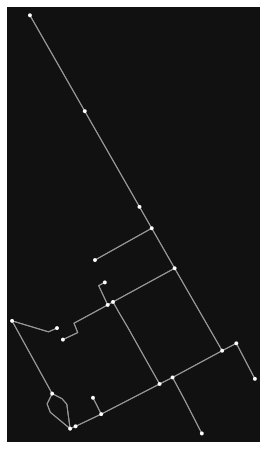

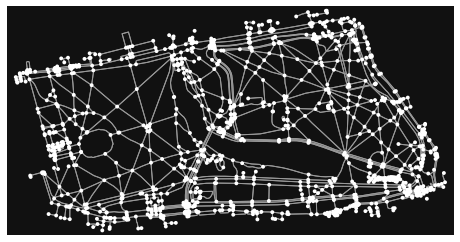

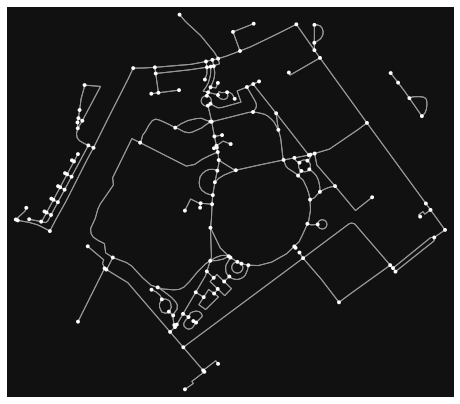

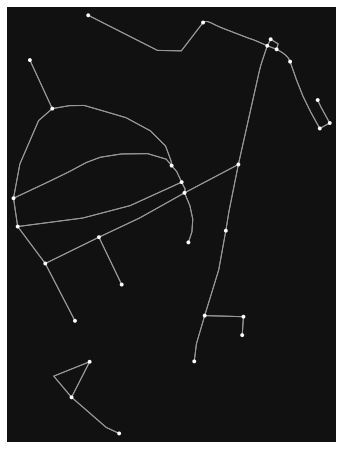

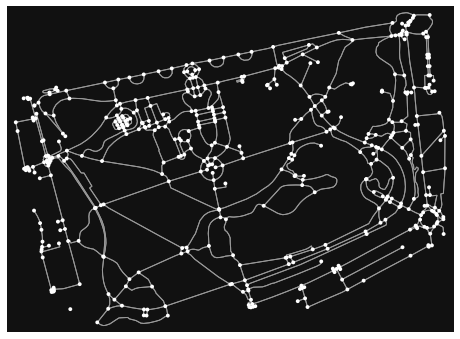

...

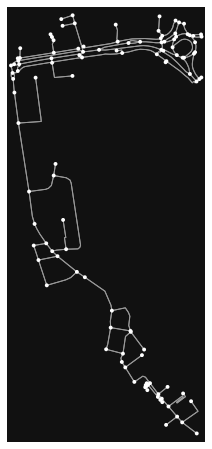

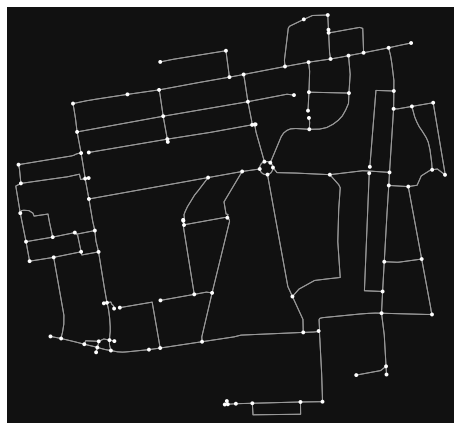

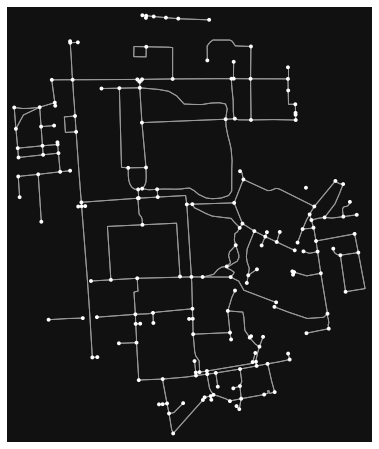

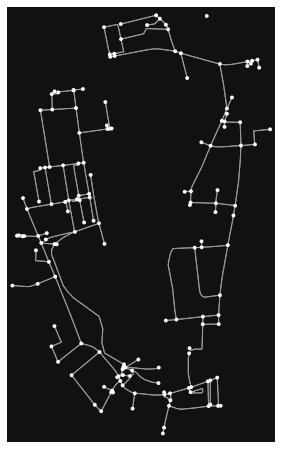

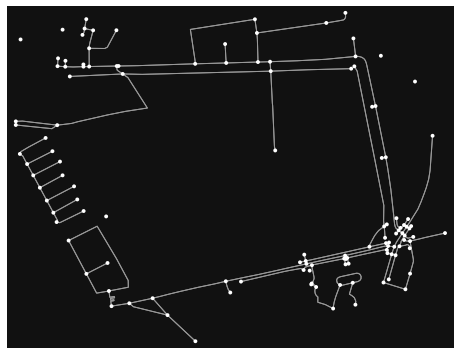

In [344]:
edges = list()
nodes = list()

graphs = list()

for polygon in parks['geometry']:
    inner = polygon.buffer(-100)
    outer = polygon.buffer(100)
    aoi = outer.difference(inner)

    intersecting_nodes = N[N.intersects(outer)].index
    G_sub = paths.subgraph(intersecting_nodes)
    try:
        fig, ax = ox.plot_graph(G_sub)
        
        N_temp, E_temp = ox.graph_to_gdfs(G_sub)
    
        nodes.append(N_temp)
        edges.append(E_temp)
    
        graphs.append(G_sub)
    except:
        pass

edges = gpd.GeoDataFrame(pd.concat(edges, ignore_index=False))
nodes = gpd.GeoDataFrame(pd.concat(nodes, ignore_index=False))